We start by adding the necessary folders to the current working path.

In [1]:
# import sys/os
import sys, os

# get current directory
path = os.getcwd()

# get parent directory
parent_directory = os.path.sep.join(path.split(os.path.sep)[:-4])

# add utils folder to current working path
sys.path.append(parent_directory+"/subfunctions/utils")

# add integration folder to current working path
sys.path.append(parent_directory+"/subfunctions/integration")

# add 'FTLE3D' folder to current working path in order to access the functions
sys.path.append(parent_directory+"/demos/AdvectiveBarriers/FTLE3D")

# Overview

In the following notebook we illustrate the numerical implementation and the use of the Mz-criterion on the three-dimensional, unsteady ABC-flow. This spatially periodic velocity field has been studied in several papers including [1,2]. As a benchmark we will use the unsteady version of the ABC-flow:

\begin{equation}
\begin{pmatrix} \dot{x}(t) \\ \dot{y}(t) \\ \dot{z}(t) \end{pmatrix} = \begin{pmatrix} u \\ v \\ w \end{pmatrix} = \begin{pmatrix} A\sin(z)+C\cos(y) \\ B\sin(x) + A\cos(z) \\ C\sin(y)+B\cos(x) \end{pmatrix}, \quad (x,y,z) \in [0, 2\pi]^3 \label{eq: periodicABC} \tag{1}.
\end{equation}

The parameters are chosen to be: $ A = \sqrt{3}, B = \sqrt{2} $ and $ C = 1 $.

The velocity field is then discretized over the 3D meshgrid $ [0,2\pi]^3 $. The notebook is structured as follows:

1. Import data from the file 'ABCsteady.mat' stored in the folder 'data/ABC'.
2. Define computational parameters and data.
3. Define spatio-temporal domain.
4. Interpolate velocity from (discrete) gridded data.
5. $ \mathrm{Mz-criterion} $:

    Compute the strain acceleration tensor $ \mathbf{M}(\mathbf{x}, t) $ along every trajectory launched at $ \mathbf{x}_0 $ over the time-interval $ t \in [t_0, t_N] $.
    
    \begin{equation}
    \mathbf{M}(\mathbf{x}, t) = \dfrac{D\mathbf{S}(\mathbf{x}, t)}{Dt} + \mathbf{S}(\mathbf{x}, t)\mathbf{\nabla v}(\mathbf{x}, t)+(\mathbf{\nabla v}(\mathbf{x}, t))^T\mathbf{S}(\mathbf{x}, t) \label{eq: M} \tag{1}
    \end{equation}
    
    Take the inner product between a material vector $ \mathbf{\xi} $ and $ \mathbf{S}\mathbf{\xi} $
    
    \begin{equation}
    \mathbf{C}(\mathbf{\xi};\mathbf{x},t) = \langle \mathbf{\xi}, \mathbf{S}(\mathbf{\mathbf{x},t}) \mathbf{\xi} \rangle \label{eq: C} \tag{2}
    \end{equation} and define the zero-strain set as
    
    \begin{equation}
    Z(\mathbf{x},t) = \lbrace \mathbf{\xi} \in \mathbb{R}^3: \langle \mathbf{\xi}, \mathbf{S}\mathbf{\xi} \rangle = 0 \rbrace \label{eq: Z} \tag{3}
    \end{equation}
    
    If the trajectory $ \mathbf{x}(t) $ at time $ t $ satisfies $ \mathbf{M}_Z(\mathbf{x}, t) \succ 0 $, then it is in a hyperbolic flow region. Otherwise, if $ \mathbf{M}_Z(\mathbf{x}, t) $ is indefinite, then it is in an elliptic flow region. $ | \ldots |_Z $ denotes the restriction of $ M $ onto the generalized zero-strain cone $ Z $. Evaluting the definiteness of the tensor along the zero-strain cone $ Z $ is a costly undertaking. The following results, however, brings considerable simplification: $ \mathbf{M}_Z $ is positive definite if and only if the quartic equation:
    
    \begin{equation}
    p^4+Ap^3+Bp^2+Cp+D=0 \label{eq: QuarticEquation} \tag{4}
    \end{equation}
    
    has no zeros in the [-1,1] interval.
    
    The coefficients A,B,C,D are outlined in the following paragraph taken from [2].
    
    Define the coordinates ($ \eta_1,\eta_2,\eta_3 $) $ \mathbf{\xi} = \eta_1 \mathbf{e}_1+\eta_2 \mathbf{e}_2 + \eta_3 \mathbf{e}_3 $, where $ \mathbf{e}_i $ and $ s_i $ denote the eigenvectors and eigenvalues of the rate of strain tensor $ \mathbf{S}(\mathbf{x},t) $. We find that $ Z $ satisfies:
    \begin{equation}
    \eta_3^2 = a \eta_1^2+(1-a)\eta_2^2, \tag{5}
    \end{equation} which defines an elliptic cone in the strain basis. If $ |s_3|>|s_1| $ then $ a(\mathbf{x},t) = -\dfrac{s_1(\mathbf{x},t)}{s_3(\mathbf{x},t)} \in (0,1) $ and $ \mathbf{E} = [\mathbf{e}_1,\mathbf{e}_2,\mathbf{e}_3]  $, elif $ |s_1|>|s_3| $ then $ a(\mathbf{x},t) = -\dfrac{s_3(\mathbf{x},t)}{s_1(\mathbf{x},t)} \in (0,1) $ and $ \mathbf{E} = [\mathbf{e}_3,\mathbf{e}_2,\mathbf{e}_1] $.
    
    Denote $ \mathbf{M} $ in strain basis by $ \tilde{M} = \mathbf{E}^T\mathbf{M}\mathbf{E} $. The coefficients A,B,C,D are
    
    \begin{align}
        A &= 4 \sqrt{a}(1-a)\dfrac{\tilde{M}_{13}[\tilde{M}_{11}(1-a)-\tilde{M}_{22}a]+2a\tilde{M}_{12}\tilde{M}_{23}}{S_0}, \tag{6}\\
        B &= 4a\dfrac{\tilde{M}_{13}^2(1-a)^2+(1-a)(a\tilde{M}_{23}^2-\tilde{M}_{12}^2)}{S_0}+2a\dfrac{[\tilde{M}_{11}(1-a)-\tilde{M}_{22}a][\tilde{M}_{33}(1-a)+\tilde{M}_{22}]}{S_0}, \tag{7} \\
        C &= 4\sqrt{a^3}(1-a)\dfrac{\tilde{M}_{13}[\tilde{M}_{33}(1-a)+\tilde{M}_{22}]-2\tilde{M}_{12}\tilde{M}_{23}}{S_0}, \tag{8} \\
        D &= a^2\dfrac{[\tilde{M}_{33}(1-a)+\tilde{M}_{22}]^2-4(1-a)\tilde{M}_{23}^2}{S_0} \tag{9},
    \end{align}
    
    where
    
    \begin{equation}
        S_0 = [\tilde{M}_{11}(1-a)-\tilde{M}_{22}a]^2+4 \tilde{M}_{12}^2a(1-a) \tag{10}.
    \end{equation}
    
    Compute the total time spent in a hyperbolic flow region ($ \tau_H $) of the trajectory $ \mathbf{x}(t) $ launched from $ \mathbf{x}_0 $ over the time-interval $ [t_0, t_N] $.
    
    Compute the total time spent in an elliptic flow region ($ \tau_E $) of the trajectory $ \mathbf{x}(t) $ launched from $ \mathbf{x}_0 $ over the time-interval $ [t_0, t_N] $.
    
    Plot $ \tau_H $ and $ \tau_E $ with respect to the initial position of the particles.
    
 <br />    
6. References

# Discretize velocity field from analytical data

We start by discretizing the velocity field from the unsteady ABC-flow.

In [2]:
# import scipy
import scipy.io as sio

# Import velocity data from file in data-folder
mat_file = sio.loadmat('../../../../data/ABC/ABCsteady.mat')

U = mat_file['u'] # array (NY, NX, NZ)
V = mat_file['v'] # array (NY, NX, NZ)
W = mat_file['w'] # array (NY, NX, NZ)
x = mat_file['x'] # array (1, NX)
y = mat_file['y'] # array (1, NY)
z = mat_file['z'] # array (1, NZ)

# Computational parameters and data

Here we define the computational parameters and the data.

In [3]:
# import numpy
import numpy as np

# Number of cores for parallel computing
Ncores = 8 # int

# Periodic boundary conditions
periodic_x = True # bool
periodic_y = True # bool
periodic_z = True # bool
periodic = [periodic_x, periodic_y, periodic_z]

# Unsteady velocity field
bool_unsteady = False # bool

# Defined domain
defined_domain = np.isfinite(U).astype(int) # array (NY, NX, NZ)

## Compute meshgrid of dataset
X, Y, Z = np.meshgrid(x, y, z) # array (NY, NX), array (NY, NX, NZ)

## Resolution of meshgrid
dx_data = X[0,1,0]-X[0,0,0] # float
dy_data = Y[1,0,0]-Y[0,0,0] # float
dz_data = Y[0,0,1]-Z[0,0,0] # float

delta = [dx_data, dy_data, dx_data] # list (3, )

# Spatio-temporal domain

Here we define the spatio-temporal domain over which to consider the dynamical system.

In [4]:
# Initial time
t0 = 0 # float

# Final time
tN = 10 # float

# Time step-size
dt = 5*10**(-2) # float

time = np.arange(t0, tN+dt, dt) # shape (Nt,)

# Length of time interval
lenT = abs(tN-t0) # float

# boundaries
xmin = 0 # float
xmax = 2*np.pi # float
ymin = 0 # float
ymax = 2*np.pi # float
zmin = 0 # float
zmax = 2*np.pi # float

# Resolution of meshgrid
Ny = 100 # int
Nx = 100 # int
Nz = 100 # int

x_domain = np.linspace(xmin, xmax, Nx, endpoint = True) # array (Nx, )
y_domain = np.linspace(ymin, ymax, Ny, endpoint = True) # array (Ny, )
z_domain = np.linspace(zmin, zmax, Nz, endpoint = True) # array (Nz, )

dx = x_domain[1]-x_domain[0] # float
dy = y_domain[1]-y_domain[0] # float
dz = z_domain[1]-z_domain[0] # float

X_domain, Y_domain, Z_domain = np.meshgrid(x_domain, y_domain, z_domain) # array (Ny, Nx, Nz)

Ny = X_domain.shape[0] # int
Nx = X_domain.shape[1] # int
Nz = X_domain.shape[2] # int

# auxiliary grid spacing
aux_grid = [0.1*dx, 0.1*dy, 0.1*dz] # list (3,)

# Interpolate velocity

In order to evaluate the velocity field at arbitrary locations, we interpolate the discrete velocity data. The interpolation with respect to time and space is linear.

In [5]:
# Import interpolation function for unsteady flow field
from ipynb.fs.defs.Interpolant import interpolant_steady

# Set nan values to zero (in case there are any) so that we can apply interpolant. 
# Interpolant does not work if the array contains nan values. 
U[np.isnan(U)] = 0
V[np.isnan(V)] = 0
W[np.isnan(W)] = 0

# Interpolate velocity data using linear spatial interpolation
Interpolant = interpolant_steady(X, Y, Z, U, V, W)

Interpolant_u = Interpolant[0] # RectangularBivariateSpline-object
Interpolant_v = Interpolant[1] # RectangularBivariateSpline-object
Interpolant_w = Interpolant[2] # RectangularBivariateSpline-object

# Hyperbolicity/Ellipticity time $ \tau_{\mathcal{H}}, \tau_{\mathcal{E}} $

Next, we compute the time spent in hyperbolic and elliptic flow regions by particles launched from $ \mathbf{x}_0 $ at time $ t_0 $

In [6]:
# Import function to compute trajectories/velocity along trajectories
from ipynb.fs.defs.integration_dFdt import integration_dFdt

# Import function to compute gradient of velocity
from ipynb.fs.defs.gradient_velocity import gradient_velocity

# Import function to compute eigenvalues
from ipynb.fs.defs.eigen import eigen

# Import package for parallel computing
from joblib import Parallel, delayed

# Import math tools
from math import sqrt

def compute_ABCD(a, M, E):
    
    M_tilde = E.transpose()@(M@E)
    
    M11 = M_tilde[0,0]
    M12 = M_tilde[0,1]
    M13 = M_tilde[0,2]
    M22 = M_tilde[1,1]
    M23 = M_tilde[1,2]
    M33 = M_tilde[2,2]
    
    S0 = (M11*(1-a)-M22*a)**2+4*M12**2*a*(1-a)
    
    A = 4*sqrt(a)*(1-a)*(M13*(M11*(1-a)-M22*a)+2*a*M12*M23)/S0
    
    B = 4*a*(M13**2*(1-a)**2+(1-a)*(a*M23**2-M12**2))/S0+2*a*(M11*(1-a)-M22*a)*(M33*(1-a)+M22)/S0
    
    C = 4*sqrt(a**3)*(1-a)*(M13*(M33*(1-a)+M22)-2*M12*M23)/S0
    
    D = a**2*((M33*(1-a)+M22)**2-4*(1-a)*M23**2)/S0

    return A, B, C, D

def check_zero_quartic_equation(A, B, C, D):
    
    x_range = np.linspace(-1,1,500, endpoint = True)
    
    for idx_x, x in enumerate(x_range):
        
        if idx_x == 0: func0 = x**4+A*x**3+B*x**2+C*x+D
        
        func = x**4+A*x**3+B*x**2+C*x+D
        
        if func*func0 <= 0:
            return True
        
    return False

# Split x0, y0 into 'Ncores' equal batches for parallel computing
def split(a, n):
    k, m = divmod(len(a), n)
    return (a[i*k+min(i, m):(i+1)*k+min(i+1, m)] for i in range(n))

def tau_Hyperbolicity_Ellipticity(x0_batch, y0_batch, z0_batch):
    
    # Initial conditions
    X0 = np.array([x0_batch, y0_batch, z0_batch])  # array (2, Nx*Ny)
    
    # Compute velocity along trajectories
    Fmap = integration_dFdt(time, X0, X, Y, Z, Interpolant_u, Interpolant_v, Interpolant_w, periodic, bool_unsteady)[0] # shape (Nt, 3, Nx*Ny)
    
    Hyperbolicity = np.zeros((Fmap.shape[0]-1, Fmap.shape[-1]))
    Ellipticity = np.zeros((Fmap.shape[0]-1, Fmap.shape[-1]))
    
    for i in range(Fmap.shape[0]-1):
        
        if np.around(i/(Fmap.shape[0]-1)*100, 2) % 2 == 0:
            
            print("Percentage completed: ", np.around(i/(Fmap.shape[0]-1)*100, 2))
          
        # Compute gradient of velocity field
        grad_vel = gradient_velocity(time[i], Fmap[i,:,:], X, Y, Z, Interpolant_u, Interpolant_v, Interpolant_w, periodic, bool_unsteady, aux_grid) # (3,3,Nx*Ny)
        
        # Compute rate of strain tensor
        S = .5*(grad_vel+grad_vel.transpose(1,0,2))
        
        # Compute gradient of velocity field at t+dt in order to evaluate partial derivative of S with respect to t
        grad_vel_dt = gradient_velocity(time[i+1], Fmap[i+1,:,:], X, Y, Z, Interpolant_u, Interpolant_v, Interpolant_w, periodic, bool_unsteady, aux_grid) # (3,3,Nx*Ny)
        
        # Compute rate of strain tensor at t + dt
        S_dt = .5*(grad_vel_dt+grad_vel_dt.transpose(1,0,2))
        
        for ii in range(Fmap.shape[-1]):
        
            # Compute eigenvalues/eigenvectors of S
            Lambda, E = eigen(S[:,:,ii])
            
            # We need to rearrange the eigenvalues s1,s2,s3 and the corresponding eigenbasis
            # If |s1|<|s3|:
            # a = -s3/s1 and E = [e3,e2,e1]
            if abs(Lambda[0])>abs(Lambda[2]):
                a = -Lambda[2]/Lambda[0]
                E = np.flip(E, axis = 1)
                
            # Else:
            # a = -s1/s3 and E = [e1,e2,e3]
            else:
                a = -Lambda[0]/Lambda[2]
            
            # Compute strain acceleration tensor M
            M = (S_dt[:,:,ii]-S[:,:,ii])/(time[i+1]-time[i])+S[:,:,ii]@grad_vel[:,:,ii]+grad_vel[:,:,ii].transpose()@S[:,:,ii]
            
            # Compute coefficients
            A, B, C, D = compute_ABCD(a, M, E)
            
            # Check if quartic equation has zero in the interval [-1,1]. It returns True if yes, otherwise False
            bool_zero = check_zero_quartic_equation(A, B, C, D)
            
            # If quartic equation has zero --> particle is in elliptic flow region 
            if bool_zero:
                
                Ellipticity[i,ii] = 1
            
            # Elif quartic equation has no zero --> particle is in hyperbolic flow region
            else:
                
                Hyperbolicity[i,ii] = 1
    
    tau_Hyperbolicity = np.mean(Hyperbolicity, axis = 0)
    tau_Ellipticity = np.mean(Ellipticity, axis = 0)
    
    return tau_Hyperbolicity, tau_Ellipticity

## XY-plane

Compute $ \mathrm{\tau}_H, \mathrm{\tau}_E $ over the 2D meshgrid on the XY-plane.

In [7]:
# Vectorize initial conditions by arranging them to a vector of size (Nx*Ny*Nz, )
x0_xy = X_domain[:,:,-1].ravel() # array (Nx*Ny, )
y0_xy = Y_domain[:,:,-1].ravel() # array (Nx*Ny, )
z0_xy = Z_domain[:,:,-1].ravel() # array (Nx*Ny, )

x0_batch = list(split(x0_xy, Ncores)) # list (Nx*Ny)
y0_batch = list(split(y0_xy, Ncores)) # list (Nx*Ny)
z0_batch = list(split(z0_xy, Ncores)) # list (Nx*Ny)
results = Parallel(n_jobs=Ncores, verbose = 2)(delayed(tau_Hyperbolicity_Ellipticity)(x0_batch[i], y0_batch[i], z0_batch[i]) for i in range(len(x0_batch)))

# Extract results of hyperbolicity and ellipticity time computation on xy-plane
tau_Hyperbolicity_xy = results[0][0]
tau_Ellipticity_xy = results[0][1]
for res in results[1:]:
    tau_Hyperbolicity_xy = np.append(tau_Hyperbolicity_xy, res[0], axis = -1)
    tau_Ellipticity_xy = np.append(tau_Ellipticity_xy, res[1], axis = -1)

# reshape vectorized arrays to structured array
X0_xy = np.array(x0_xy).reshape(Ny,Nx) # array (Ny, Nx)
Y0_xy = np.array(y0_xy).reshape(Ny,Nx) # array (Ny, Nx)
Z0_xy = np.array(z0_xy).reshape(Ny,Nx) # array (Ny, Nx)
tau_Hyperbolicity_xy = np.array(tau_Hyperbolicity_xy).reshape(Ny,Nx) # array (Ny, Nx)
tau_Ellipticity_xy = np.array(tau_Ellipticity_xy).reshape(Ny,Nx) # array (Ny, Nx)

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   3 out of   8 | elapsed:  5.5min remaining:  9.1min
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:  5.7min remaining:    0.0s
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:  5.7min finished


## XZ-plane

Compute $ \mathrm{\tau}_H, \mathrm{\tau}_E $ over the 2D meshgrid on the XZ-plane.

In [8]:
# Vectorize initial conditions by arranging them to a vector of size (Nx*Ny*Nz, )
x0_xz = X_domain[0,:,:].ravel() # array (Nx*Nz, )
y0_xz = Y_domain[0,:,:].ravel() # array (Nx*Nz, )
z0_xz = Z_domain[0,:,:].ravel() # array (Nx*Nz, )

x0_batch = list(split(x0_xz, Ncores)) # list (Nx*Nz)
y0_batch = list(split(y0_xz, Ncores)) # list (Nx*Nz)
z0_batch = list(split(z0_xz, Ncores)) # list (Nx*Nz)
results = Parallel(n_jobs=Ncores, verbose = 2)(delayed(tau_Hyperbolicity_Ellipticity)(x0_batch[i], y0_batch[i], z0_batch[i]) for i in range(len(x0_batch)))

# Extract results of hyperbolicity and ellipticity time computation on xy-plane
tau_Hyperbolicity_xz = results[0][0]
tau_Ellipticity_xz = results[0][1]
for res in results[1:]:
    tau_Hyperbolicity_xz = np.append(tau_Hyperbolicity_xz, res[0], axis = -1)
    tau_Ellipticity_xz = np.append(tau_Ellipticity_xz, res[1], axis = -1)

# reshape vectorized arrays to structured array
X0_xz= np.array(x0_xz).reshape(Nz,Nx) # array (Nz, Nx)
Y0_xz = np.array(y0_xz).reshape(Nz,Nx) # array (Nz, Nx)
Z0_xz = np.array(z0_xz).reshape(Nz,Nx) # array (Nz, Nx)
tau_Hyperbolicity_xz = np.array(tau_Hyperbolicity_xz).reshape(Nz,Nx) # array (Ny, Nx)
tau_Ellipticity_xz = np.array(tau_Ellipticity_xz).reshape(Nz,Nx) # array (Ny, Nx)

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   3 out of   8 | elapsed:  4.4min remaining:  7.4min
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:  6.6min remaining:    0.0s
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:  6.6min finished


## YZ-plane

Compute $ \mathrm{\tau}_H, \mathrm{\tau}_E $ over the 2D meshgrid on the YZ-plane.

In [9]:
# Vectorize initial conditions by arranging them to a vector of size (Nx*Ny*Nz, )
x0_yz = X_domain[:,0,:].ravel() # array (Nx*Ny, )
y0_yz = Y_domain[:,0,:].ravel() # array (Nx*Ny, )
z0_yz = Z_domain[:,0,:].ravel() # array (Nx*Ny, )

x0_batch = list(split(x0_yz, Ncores)) # list (Nx*Ny)
y0_batch = list(split(y0_yz, Ncores)) # list (Nx*Ny)
z0_batch = list(split(z0_yz, Ncores)) # list (Nx*Ny)
results = Parallel(n_jobs=Ncores, verbose = 2)(delayed(tau_Hyperbolicity_Ellipticity)(x0_batch[i], y0_batch[i], z0_batch[i]) for i in range(len(x0_batch)))

# Extract results of hyperbolicity and ellipticity time computation on xy-plane
tau_Hyperbolicity_yz = results[0][0]
tau_Ellipticity_yz = results[0][1]
for res in results[1:]:
    tau_Hyperbolicity_yz = np.append(tau_Hyperbolicity_yz, res[0], axis = -1)
    tau_Ellipticity_yz = np.append(tau_Ellipticity_yz, res[1], axis = -1)

# reshape vectorized arrays to structured array
X0_yz= np.array(x0_yz).reshape(Nz,Ny) # array (Nz, Nx)
Y0_yz = np.array(y0_yz).reshape(Nz,Ny) # array (Nz, Nx)
Z0_yz = np.array(z0_yz).reshape(Nz,Ny) # array (Nz, Nx)
tau_Hyperbolicity_yz = np.array(tau_Hyperbolicity_yz).reshape(Nz,Ny) # array (Ny, Nx)
tau_Ellipticity_yz = np.array(tau_Ellipticity_yz).reshape(Nz,Ny) # array (Ny, Nx)

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   3 out of   8 | elapsed:  6.7min remaining: 11.1min
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:  6.9min remaining:    0.0s
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:  6.9min finished


###### Hyperbolicity time $ \tau_H $

In [ ]:
# Import plotly for 3D figures
from plotly import graph_objs as go

# define minimum and maximum values for colorbar
min_value = min(np.min(tau_Hyperbolicity_yz),min(np.min(tau_Hyperbolicity_xy), np.min(tau_Hyperbolicity_xz)))
max_value = max(np.max(tau_Hyperbolicity_yz),max(np.max(tau_Hyperbolicity_xy), np.max(tau_Hyperbolicity_xz)))

# create figure
fig = go.Figure(data=[go.Surface(x = X0_xy, y = Y0_xy, z = Z0_xy, surfacecolor = tau_Hyperbolicity_xy, showscale = True, colorscale='rainbow', cmin=min_value, cmax=max_value)])
fig.add_trace(go.Surface(x = X0_xz, y = Y0_xz, z = Z0_xz, surfacecolor = tau_Hyperbolicity_xz, showscale = False, colorscale='rainbow', cmin=min_value, cmax=max_value))
fig.add_trace(go.Surface(x = X0_yz, y = Y0_yz, z = Z0_yz, surfacecolor = tau_Hyperbolicity_yz, showscale = False, colorscale='rainbow', cmin=min_value, cmax=max_value))
fig.add_trace(go.Surface(x = X0_xy, y = Y0_xy, z = Z0_xy-2*np.pi, surfacecolor = tau_Hyperbolicity_xy, showscale = False, colorscale='rainbow', cmin=min_value, cmax=max_value))
fig.add_trace(go.Surface(x = X0_xz, y = Y0_xz+2*np.pi, z = Z0_xz, surfacecolor = tau_Hyperbolicity_xz, showscale = False, colorscale='rainbow', cmin=min_value, cmax=max_value))
fig.add_trace(go.Surface(x = X0_yz+2*np.pi, y = Y0_yz, z = Z0_yz, surfacecolor = tau_Hyperbolicity_yz, showscale = False, colorscale='rainbow', cmin=min_value, cmax=max_value))

# camera
camera = dict(eye=dict(x=-1.45,y=-1.45,z=1.7))
fig.update_layout(scene_camera=camera)

fig.show()

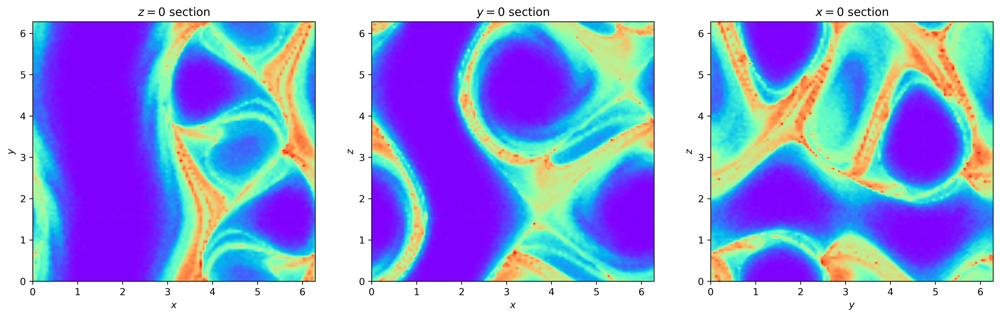

In [11]:
# import matplotlib
import matplotlib.pyplot as plt

f,axes = plt.subplots(ncols = 3, nrows = 1, figsize = (18, 5), dpi = 450)
cmapToUse = 'rainbow'
nContours = 600

axes[0].contourf(x_domain, y_domain, tau_Hyperbolicity_xy, nContours,  cmap = cmapToUse)
axes[0].set_xlabel('$x$')
axes[0].set_ylabel('$y$')
axes[0].set_title('$z=0$ section')

axes[1].contourf(x_domain, z_domain, tau_Hyperbolicity_xz, nContours,  cmap = cmapToUse)
axes[1].set_xlabel('$x$')
axes[1].set_ylabel('$z$')
axes[1].set_title('$y=0$ section')

axes[2].contourf(y_domain, z_domain, tau_Hyperbolicity_yz, nContours,  cmap = cmapToUse)
axes[2].set_xlabel('$y$')
axes[2].set_ylabel('$z$')
axes[2].set_title('$x=0$ section')

plt.show()

###### Ellipticity time $ \tau_E $

In [ ]:
# Import plotly for 3D figures
from plotly import graph_objs as go

# define minimum and maximum values for colorbar
min_value = min(np.min(tau_Ellipticity_yz),min(np.min(tau_Ellipticity_xy), np.min(tau_Ellipticity_xz)))
max_value = max(np.max(tau_Ellipticity_yz),max(np.max(tau_Ellipticity_xy), np.max(tau_Ellipticity_xz)))

# create figure
fig = go.Figure(data=[go.Surface(x = X0_xy, y = Y0_xy, z = Z0_xy, surfacecolor = tau_Ellipticity_xy, showscale = True, colorscale='rainbow', cmin=min_value, cmax=max_value)])
fig.add_trace(go.Surface(x = X0_xz, y = Y0_xz, z = Z0_xz, surfacecolor = tau_Ellipticity_xz, showscale = False, colorscale='rainbow', cmin=min_value, cmax=max_value))
fig.add_trace(go.Surface(x = X0_yz, y = Y0_yz, z = Z0_yz, surfacecolor = tau_Ellipticity_yz, showscale = False, colorscale='rainbow', cmin=min_value, cmax=max_value))
fig.add_trace(go.Surface(x = X0_xy, y = Y0_xy, z = Z0_xy-2*np.pi, surfacecolor = tau_Ellipticity_xy, showscale = False, colorscale='rainbow', cmin=min_value, cmax=max_value))
fig.add_trace(go.Surface(x = X0_xz, y = Y0_xz+2*np.pi, z = Z0_xz, surfacecolor = tau_Ellipticity_xz, showscale = False, colorscale='rainbow', cmin=min_value, cmax=max_value))
fig.add_trace(go.Surface(x = X0_yz+2*np.pi, y = Y0_yz, z = Z0_yz, surfacecolor = tau_Ellipticity_yz, showscale = False, colorscale='rainbow', cmin=min_value, cmax=max_value))

# camera
camera = dict(eye=dict(x=-1.45,y=-1.45,z=1.7))
fig.update_layout(scene_camera=camera)

fig.show()

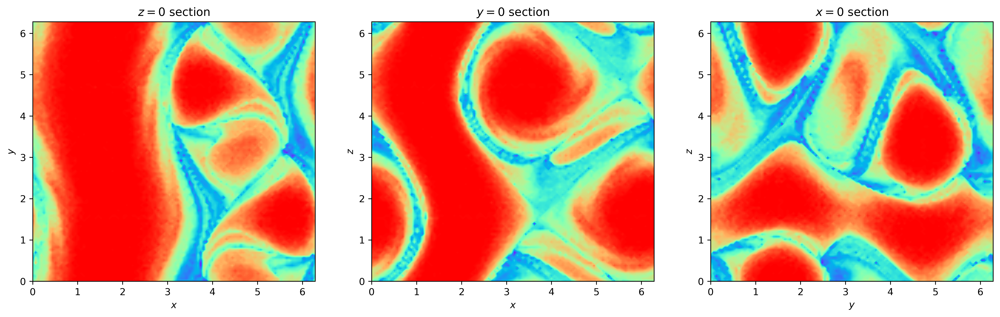

In [13]:
# plot

f,axes = plt.subplots(ncols = 3, nrows = 1, figsize = (18, 5), dpi = 450)
cmapToUse = 'rainbow'
nContours = 600

axes[0].contourf(x_domain, y_domain, tau_Ellipticity_xy, nContours,  cmap = cmapToUse)
axes[0].set_xlabel('$x$')
axes[0].set_ylabel('$y$')
axes[0].set_title('$z=0$ section')

axes[1].contourf(x_domain, z_domain, tau_Ellipticity_xz, nContours,  cmap = cmapToUse)
axes[1].set_xlabel('$x$')
axes[1].set_ylabel('$z$')
axes[1].set_title('$y=0$ section')

axes[2].contourf(y_domain, z_domain, tau_Ellipticity_yz, nContours,  cmap = cmapToUse)
axes[2].set_xlabel('$y$')
axes[2].set_ylabel('$z$')
axes[2].set_title('$x=0$ section')

plt.show()

The total time spent inside hyperbolic/elliptic regions is plotted with respect to initial positions.

# References

[1] Haller, G. (2005). An objective definition of a vortex. Journal of fluid mechanics, 525, 1-26.

[2] Dombre, T., Frisch, U., Greene, J. M., Hénon, M., Mehr, A., & Soward, A. M. (1986). Chaotic streamlines in the ABC flows. Journal of Fluid Mechanics, 167, 353-391.

[3] Notebook 5.14. in "Transport Barriers and Coherent Structures in Flow Data" by Prof. George Haller.

[4] [YouTube Tutorial](https://youtu.be/G3MFuCSk7Vs)